In [1]:
"""Load Data
Structure:
    1. Imports, Variables, Functions
    2. Load Data
"""

# 1. Imports, Variables, Functions
# imports
import xml.etree.ElementTree as ET, os
import pandas as pd, numpy as np, os, sys
import anndata as ad
import logging
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import json
import random
from typing import *
from sklearn.metrics import (
    roc_auc_score,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score,
)
from sklearn.metrics import confusion_matrix, classification_report
from itertools import permutations, product
from tqdm import tqdm

logging.basicConfig(level=logging.INFO)

# variables

run_dir = os.path.join("..", "outputs", "run-24-11-14-25")
output_dir = os.path.join(run_dir, "outputs")
split_n = 0
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

mesh_file_path = os.path.join(
    "/aloy/home/ddalton/projects/disease_signatures/data/MeSH/desc2023.xml"
)

mesh_da_mappings_path = "/aloy/home/ddalton/projects/disease_signatures/data/DiSignAtlas/mesh_tree_terms.pkl"

df_info_path = os.path.join(
    "/aloy",
    "home",
    "ddalton",
    "projects",
    "disease_signatures",
    "data",
    "DiSignAtlas",
    "Disease_information_Datasets_extended.csv",
)

# functions


def load_run_output(input_dir: str) -> tuple:
    """Load the output of a run
    Args:
        input_dir (str): path to the run output directory
    Returns:
        loaded_variables (tuple): tuple of loaded variables
    """

    variables_to_load = [
        # "split",
        "predictions_test",
        "labels_test",
        "results_test",
        "all_outputs_test",
        "predictions_valid",
        "labels_valid",
        "results_valid",
        "all_outputs_valid",
        "predictions_train",
        "labels_train",
        "results_train",
        "all_outputs_train",
        "adata_orig",
        "id2type",
        "train_indices",
        "valid_indices",
        # "adata_train_1",
        # "adata_valid_1",
        # "adata_test_1",
    ]

    # initialize loaded variables as an empty tuple
    loaded_variables = ()

    # loop through variables
    for variable in variables_to_load:
        if variable.startswith("adata"):

            # do not load everything
            loaded_variable = ad.read_h5ad(
                os.path.join(input_dir, f"{variable}.h5ad")
                # , backed="r"
            )

        else:
            with open(os.path.join(input_dir, f"{variable}.pkl"), "rb") as f:
                loaded_variable = pickle.load(f)

        # add the loaded variable to the tuple
        loaded_variables += (loaded_variable,)

    print(f"Nº of loaded variables {len(loaded_variables)}")

    return loaded_variables


def load_comparison_matrix_all(output_dir: str, comparison_type: str) -> np.matrix:
    """Load the comparison matrix
    Args:
        - output_dir (str): path to the output directory
        - comparison_type (str): type of comparison matrix to load
    Returns:
        - matrix (np.matrix): comparison matrix
    """

    if comparison_type == "Cosine Similarity":
        file_name = "c_matrix"
    if comparison_type == "Euclidean Distance":
        file_name = "e_matrix"
    if comparison_type == "Pearson Correlation":
        file_name = "p_matrix"

    file_name = f"{file_name}_all_parallel.split_1.npy"

    matrix = np.load(os.path.join(output_dir, file_name))

    return matrix


def get_dsaid_relationships(
    disease_id: List,
    disease_tree: List,
    rest_ids: List,
    rest_trees: List,
    tree_root: str,
    relationship: str,
) -> np.array:
    """Get idxs for dsaids based on relationship
    Args:
        - disease_id (List): Disease ID
        - disease_tree (List): Disease Tree
        - rest_ids (List): Rest of the IDs
        - rest_trees (List): Rest of the Trees
        - tree_root (str): Root Tree
        - relationship (str): Relationship
    Returns:
        - idxs (np.array): Array of indexes
    """
    disease_tree = shorten_terms(disease_tree)
    rest_trees = shorten_terms(rest_trees)

    idxs = list()

    for idx in range(len(rest_ids)):
        rest_id_i = rest_ids[idx]
        rest_tree_i = rest_trees[idx]

        # disease id
        condition_1 = disease_id == rest_id_i

        # Related MeSH trees w/ disease
        condition_2 = len(set(disease_tree).intersection(set(rest_tree_i))) > 0

        # Same root tree
        condition_3 = len(set([tree_root]).intersection(set(rest_tree_i))) > 0

        if relationship == "same_disease":

            # Must have same Disease ID!
            if condition_1:
                idxs.append(idx)

        elif relationship == "related_disease":

            # Different Disease ID but same family as Root Tree
            if condition_1 and condition_3:
                idxs.append(idx)

        elif relationship == "unrelated_disease":

            # Different Disease ID and different family to Disease at all levels!
            if condition_1 and not condition_2:
                idxs.append(idx)

    return np.array(idxs)


def parse_mesh_data(file_path):
    """Parse MeSH XML data and extract disease terms."""
    tree = ET.parse(file_path)
    root = tree.getroot()

    # Dictionary to map tree numbers to disease terms
    tree_2_term = {}
    term_2_tree = {}

    # Extract disease terms and tree numbers
    for descriptor in root.findall("DescriptorRecord"):
        # Get the disease term name
        term = descriptor.find("DescriptorName/String").text

        # Get all tree numbers for this term
        tree_numbers = descriptor.findall("TreeNumberList/TreeNumber")

        for tree_number in tree_numbers:
            # Check for disease-related tree numbers starting with 'C'
            # if tree_number.text.startswith("C"):
            # Map each tree number to its term
            tree_2_term[tree_number.text] = term
            term_2_tree[term] = tree_number.text

    return tree_2_term, term_2_tree


def parse_mesh_data_with_ids(file_path):
    """Parse MeSH XML data and extract disease terms along with MeSH IDs."""
    tree = ET.parse(file_path)
    root = tree.getroot()

    # Dictionaries to map tree numbers and MeSH IDs to disease terms
    tree_2_term = {}
    term_2_tree = {}
    mesh_id_2_term = {}

    # Extract disease terms, tree numbers, and MeSH IDs
    for descriptor in root.findall("DescriptorRecord"):
        # Get the disease term name
        term = descriptor.find("DescriptorName/String").text

        # Get the MeSH ID
        mesh_id = descriptor.find("DescriptorUI").text
        mesh_id_2_term[mesh_id] = term

        # Get all tree numbers for this term
        tree_numbers = descriptor.findall("TreeNumberList/TreeNumber")

        for tree_number in tree_numbers:
            # Map each tree number to its term
            tree_2_term[tree_number.text] = term
            term_2_tree[term] = tree_number.text

    return tree_2_term, term_2_tree, mesh_id_2_term


def shorten_terms(mesh_terms: List) -> List:
    """Shorten Terms
    Args:
        - mesh_terms(List): List of MeSH terms
    Returns:
        - List: List of shortened MeSH terms
    """
    return [x.split(".")[0] for x in mesh_terms]


def get_unrelated_dsaids_from_dataset(dsaids: List, dsaid_2_tree_terms: dict) -> Set:
    """Check if 2+ dsaids from the same dataset are unrelated!
    Args:
        - mesh_id_1(str): MeSH ID 1
        - mesh_id_2(str): MeSH ID 2
        - dsaid_2_tree_terms(dict): Dictionary with MeSH ID to term
    Returns:
        - Set: MeSH IDs that are unrelated
    """
    unrelated_dsaids = set()
    n_dsaids = len(dsaids)
    for i in range(n_dsaids):
        for j in range(i + 1, n_dsaids):
            dsaid_i = dsaids[i]
            dsaid_j = dsaids[j]

            # get tree terms
            term_i = dsaid_2_tree_terms.get(dsaid_i)
            term_j = dsaid_2_tree_terms.get(dsaid_j)

            # exclude overly general terms - i.e don't want "Neoplasm"
            term_i = [x for x in term_i if len(x.split(".")) > 1]
            term_j = [x for x in term_j if len(x.split(".")) > 1]

            # shorten terms to simplify comparisons
            term_i = shorten_terms(term_i)
            term_j = shorten_terms(term_j)

            # check no related terms between
            if len(set(term_i).intersection(set(term_j))) == 0:
                unrelated_dsaids.add(dsaid_i)
                unrelated_dsaids.add(dsaid_j)

    return unrelated_dsaids


def get_unrelated_dsaids_from_all(df: pd.DataFrame, dsaid_2_tree_terms: dict) -> List:
    """Get unrelated dsaids from all datasets
    Args:
        - df(pd.DataFrame): DataFrame with the information
    Returns:
        - List: List of unrelated dsaids
    """
    # Get datasets which have 1+ diseases
    df = df.groupby("dataset").filter(lambda x: x["mesh_id"].nunique() >= 2)

    unrelated_dsaids = set()
    for dataset_i in df["dataset"].unique():
        QUERY = f"dataset == '{dataset_i}'"
        dsaids_i = df.query(QUERY)["dsaid"].to_list()
        unrelated_dsaids_i = get_unrelated_dsaids_from_dataset(
            dsaids_i, dsaid_2_tree_terms
        )
        unrelated_dsaids.update(unrelated_dsaids_i)

    return list(unrelated_dsaids)


def get_list_unrelated_dsaids_from_dataset(
    dsaids: List, dsaid_2_tree_terms: dict
) -> Set:
    """Check if 2+ dsaids from the same dataset are unrelated!
    Args:
        - mesh_id_1(str): MeSH ID 1
        - mesh_id_2(str): MeSH ID 2
        - dsaid_2_tree_terms(dict): Dictionary with MeSH ID to term
    Returns:
        - Set: MeSH IDs that are unrelated
    """
    l_unrelated_dsaids = list()

    n_dsaids = len(dsaids)
    for i in range(n_dsaids):
        for j in range(i + 1, n_dsaids):
            dsaid_i = dsaids[i]
            dsaid_j = dsaids[j]

            # get tree terms
            term_i = dsaid_2_tree_terms.get(dsaid_i, "")
            term_j = dsaid_2_tree_terms.get(dsaid_j, "")

            # exclude overly general terms - i.e don't want "Neoplasm"
            term_i = [x for x in term_i if len(x.split(".")) > 1]
            term_j = [x for x in term_j if len(x.split(".")) > 1]

            # shorten terms to simplify comparisons
            term_i = shorten_terms(term_i)
            term_j = shorten_terms(term_j)

            # check no related terms between
            if len(set(term_i).intersection(set(term_j))) == 0:
                l_unrelated_dsaids.append((dsaid_i, dsaid_j))

    return l_unrelated_dsaids


def get_relationship(
    mesh_id: str, df_obs: pd.DataFrame, mesh_id_2_tree_terms: dict
) -> List:
    """Get Relationship between two diseases
    Args:
        - mesh_id (str): MeSH ID
        - df_obs (pd.DataFrame): DataFrame with disease information
        - mesh_id_2_tree_terms (dict): Mapping of MeSH ID to Tree Terms
    Returns:
        - relationship (List): List of relationships
    """

    # get root tree terms
    tree_term = shorten_terms(mesh_id_2_tree_terms[mesh_id])

    relationship = list()

    for i, row in df_obs.iterrows():
        disease_i = row["disease"]
        mesh_id_i = row["mesh_id_study"]
        tree_term_i = shorten_terms(mesh_id_2_tree_terms[mesh_id_i])

        # check if same disease
        condition_1 = mesh_id == mesh_id_i

        # check if control
        condition_2 = disease_i == "Control"

        # check if unrelated
        condition_3 = len(set(tree_term).intersection(set(tree_term_i))) > 0

        # Same Disease
        if condition_1 and not condition_2:
            relationship.append("same disease")

        # Control for same Disease
        elif condition_1 and condition_2:
            relationship.append("control")

        # # Related Disease
        # elif condition_3 and not condition_2:
        #     relationship.append("related disease")

        # Unrelated disease
        elif not condition_3 and not condition_2:
            relationship.append("unrelated disease")

        else:
            relationship.append("other")

    return relationship


# 2. Load Data
(
    # split,
    predictions_test,
    labels_test,
    results_test,
    all_outputs_test,
    predictions_valid,
    labels_valid,
    results_valid,
    all_outputs_valid,
    predictions_train,
    labels_train,
    results_train,
    all_outputs_train,
    adata_orig,
    id2type,
    train_indices,
    valid_indices,
    # adata_train,
    # adata_valid,
    # adata_test,
) = load_run_output(run_dir)

# load json

with open(os.path.join(run_dir, "parameters.json"), "r") as f:
    parameters = json.load(f)

for k, v in parameters.items():
    print(f"{k}: {v}")


# define train & test splits
split_n = 0
adata_test = adata_orig.obs[adata_orig.obs[f"test_split_{split_n+1}"] == 1]
adata_train = adata_orig[adata_orig.obs[f"test_split_{split_n+1}"] == 0]


# load DiSignAtlas info
df_info = pd.read_csv(df_info_path)

# load MeSH data
tree_2_term, term_2_tree = parse_mesh_data(file_path=mesh_file_path)

# map DisignAtlas to MeSH tree
mesh_da_mappings = pickle.load(open(mesh_da_mappings_path, "rb"))

dsaid_2_mesh_id = dict(zip(mesh_da_mappings["dsaids"], mesh_da_mappings["mesh_ids"]))
dsaid_2_tree_terms = dict(
    zip(mesh_da_mappings["dsaids"], mesh_da_mappings["mesh_tree_terms"])
)

mesh_id_2_tree_terms = {
    k[0]: v
    for k, v in zip(mesh_da_mappings["mesh_ids"], mesh_da_mappings["mesh_tree_terms"])
    if len(k) > 0
}

# clean up tree terms
# for k, v in dsaid_2_tree_terms.items():
#     dsaid_2_tree_terms[k] = [x for x in v if x.startswith("C")]

# for k, v in mesh_id_2_tree_terms.items():
#     mesh_id_2_tree_terms[k] = [x for x in v if x.startswith("C")]

# get adata test, valid & train
adata_test = adata_orig[adata_orig.obs[f"test_split_1"] == 1]
adata = adata_orig[adata_orig.obs[f"test_split_1"] == 0]

adata_valid = adata[valid_indices[0], :]
adata_train = adata[train_indices[0], :]


# get concatenated adata.obs
df_obs = pd.concat([adata_test.obs, adata_valid.obs, adata_train.obs])

# reset index !
df_obs.reset_index(drop=True, inplace=True)


df_obs["gsm"] = df_obs["ids"].apply(lambda x: x.split(";")[1])

mask = ~df_obs["gsm"].duplicated(keep="first")  # Keep the first occurrence
df_obs = df_obs[mask]
df_obs.reset_index(drop=True, inplace=True)

# Get dsaids with unrelated diseases
unrelated_dsaids = get_unrelated_dsaids_from_all(df_obs, dsaid_2_tree_terms)

# get dataframe w/ dsaids which have same dataset unrelated diseases
df_unrelated = df_obs[df_obs["dsaid"].isin(unrelated_dsaids)].copy()

Nº of loaded variables 16
data_path: /aloy/home/ddalton/projects/scGPT_playground/data/pp_data-24-11-11-01/data.h5ad
max_seq_len: 3501
batch_size: 16
gene_presence_pct: 0.9
benchmark_data: False
split_type: mixed
val_split_type: random
n_splits: 3
n_tested_splits: 3
epochs: 20
gene_filtering: top_presence
sample_presence_pct: 0.3
ADV: False
INPUT_BATCH_LABELS: False


In [25]:
from typing import *
def flatten_list(x:List)->List:
    return [item for sublist in x for item in sublist]


library_strategies_of_interest = ["RNA-Seq", "Microarray"]

# filter by library strategy
QUERY = f"library_strategy in @library_strategies_of_interest & organism == 'Homo sapiens'"
df_filtered = df_info.query(QUERY)

len(set(flatten_list([x.split(";") for x in df_filtered["Control"].to_list() if len(x)>0])))
# len(flatten_list([x.split(";") for x in df_filtered["Control"].to_list() if len(x)>0]))


55647

In [ ]:
[x.split(";") for x in df_filtered["Control"].to_list() if len(x)>0]

In [28]:
df_filtered["n_samples"] = [len(x) for x in df_filtered["Case"].to_list()]

/tmp/ipykernel_4148/3020837590.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["n_samples"] = [len(x) for x in df_filtered["Case"].to_list()]


<Axes: >

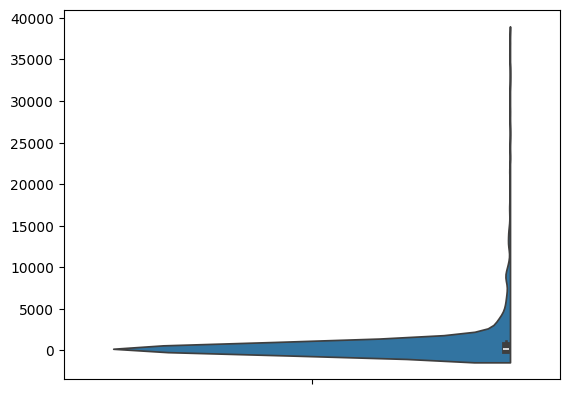

In [34]:
# Group by 'disease' and sum 'n_samples'

grouped_df = df_filtered.groupby("disease", as_index=False)["n_samples"].sum()

grouped_df.sort_values(by='n_samples', ascending=False)

sns.violinplot(grouped_df["n_samples"].to_list(), split=True)

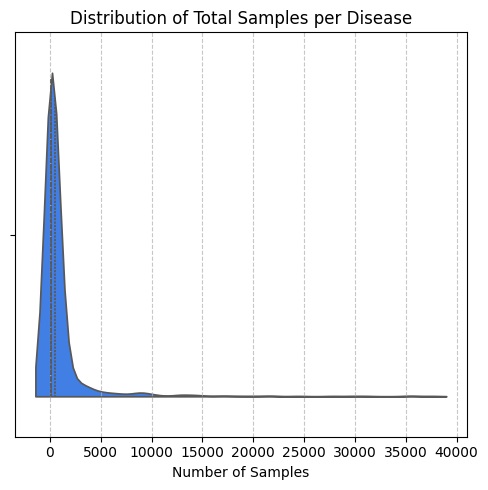

In [ ]:
plt.figure(figsize=(5, 5))

sns.violinplot(x=grouped_df["n_samples"].to_list(), split=True, orient='h', inner="quart", color="#2779ffff")



# Add gridlines

plt.grid(axis='x', linestyle='--', alpha=0.7)



# Set labels and title

plt.xlabel("Number of Samples")

plt.title("Nº Samples per Disease")

plt.tight_layout()

plt.show()

In [19]:
df_filtered.sort_values(by='n_samples', ascending=True)

,dsaid,accession,platform,deg_count,disease,diseaseid,tissue,data_source,library_strategy,organism,control_case_sample_count,definition,Control,Case,n_samples
5040,DSA05041,E-MTAB-7406,A-AFFY-44,0,Asthma,C0004096,Bronchus,ArrayExpress,Microarray,Homo sapiens,3|1,DO:A bronchial disease that is characterized b...,ASM8;ASM5;ASM11,ASM14,5
5039,DSA05040,E-MTAB-7406,A-AFFY-44,0,Asthma,C0004096,Bronchus,ArrayExpress,Microarray,Homo sapiens,3|1,DO:A bronchial disease that is characterized b...,ASM9;ASM6;ASM12,ASM15,5
5037,DSA05038,E-MTAB-7406,A-AFFY-44,0,Asthma,C0004096,Bronchus,ArrayExpress,Microarray,Homo sapiens,3|1,DO:A bronchial disease that is characterized b...,ASM7;ASM4;ASM10,ASM13,5
4986,DSA04987,E-MTAB-8887,A-MEXP-2320,1,Hepatocellular Carcinoma,C0334287,Liver,ArrayExpress,Microarray,Homo sapiens,2|1,DO:A hepatocellular carcinoma characterized mi...,NT-05;NT-08,HCC-05,6
4971,DSA04972,E-MTAB-8887,A-MEXP-2320,328,Cholangiocellular Carcinoma,C0206698,Liver,ArrayExpress,Microarray,Homo sapiens,2|1,DO:A bile duct carcinoma that derives_from epi...,NT-14;NT-17,HCC-17,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8964,DSA08965,TCGA-KIRC,NaN,1000,Kidney Clear Cell Carcinoma,C0279702,NaN,TCGA,RNA-Seq,Homo sapiens,72|535,DO:A hereditary renal cell carcinoma that has_...,Click to openTCGA-B0-5691-11A;TCGA-B0-5703-11A...,Click to openTCGA-BP-4355-01A;TCGA-A3-3359-01A...,9107
8995,DSA08996,TCGA-UCEC,NaN,1000,Uterine Corpus Endometrioid Carcinoma,C1336905,NaN,TCGA,RNA-Seq,Homo sapiens,35|548,DO:An endometrial carcinoma that derives_from ...,Click to openTCGA-AJ-A3NE-11A;TCGA-AJ-A3NC-11A...,Click to openTCGA-D1-A3JP-01A;TCGA-AJ-A3NE-01A...,9328
5071,DSA05072,GSE193677,GPL16791,1000,Ulcerative Colitis,C0009324,Bowel,GEO,RNA-Seq,Homo sapiens,458|872,DO:An inflammatory bowel disease that has_mate...,Click to openGSM5976509;GSM5976510;GSM5976511;...,Click to openGSM5976499;GSM5976500;GSM5976501;...,9604
8946,DSA08947,TCGA-BRCA,NaN,1000,Invasive Breast Carcinoma,C0853879,NaN,TCGA,RNA-Seq,Homo sapiens,112|1096,EFO:A carcinoma that infiltrates the breast pa...,Click to openTCGA-BH-A1F0-11B;TCGA-BH-A0BZ-11A...,Click to openTCGA-A2-A0CY-01A;TCGA-B6-A40B-01A...,18644


In [22]:
print(
    f"Nº of Unique Diseases in comparison for unrelated same dataset: {df_unrelated['mesh_disease'].nunique()}"
)
print(
    f"Nº of Samples in comparison for unrelated same dataset: {df_unrelated.shape[0]}"
)
print(
    f"Nº of Unique Datasets in comparison for unrelated same dataset: {df_unrelated['dataset'].nunique()}"
)

Nº of Unique Diseases in comparison for unrelated same dataset: 38
Nº of Samples in comparison for unrelated same dataset: 1868
Nº of Unique Datasets in comparison for unrelated same dataset: 22


In [68]:
same_dis_dt = list()
control = list()
unrelated_dt = list()
same_dis = list()
# related_dis = list()
# unrelated = list()
other = list()

labels_dis = list()

# Loop through datasets w/ unrelated diseases
for dataset_i in tqdm(df_unrelated["dataset"].unique()):

    QUERY = f"dataset == '{dataset_i}'"
    df_dataset = adata_train.obs.query(QUERY)

    same_dis_dt_i = list()
    control_i = list()
    unrelated_dt_i = list()
    same_dis_i = list()
    # related_dis_i = list()
    # unrelated_i = list()
    other_i = list()

    labels_dis_i = list()
    # Loop through diseases in dataset
    for mesh_j in df_dataset["mesh_id_study"].unique():

        # define relationships knowing the disease
        df_obs["relationship"] = get_relationship(mesh_j, df_obs, mesh_id_2_tree_terms)

        # get same disease indexes
        QUERY = "dataset == @dataset_i and relationship == 'same disease'"
        same_dis_dt_idxs = df_obs.query(QUERY).index.to_list()
        disease_i = df_obs.query(QUERY)["disease"].values[0]

        # get control indexes
        QUERY = "dataset == @dataset_i and relationship == 'control'"
        control_idxs = df_obs.query(QUERY).index.to_list()

        # get unrelated same dataset indexes
        QUERY = "dataset == @dataset_i and relationship == 'unrelated disease'"
        unrelated_dt_idxs = df_obs.query(QUERY).index.to_list()
        unrelated_diseases_i = df_obs.query(QUERY)["disease"].unique()

        # get same disease indexes
        QUERY = "dataset != @dataset_i and relationship == 'same disease'"
        same_dis_idxs = df_obs.query(QUERY).index.to_list()

        # # get related disease indexes
        # QUERY = "relationship == 'related disease' and dataset != @dataset_i"
        # related_dis_idxs = df_obs.query(QUERY).index.to_list()

        # # get unrelated disease different indexes
        # QUERY = "relationship == 'unrelated disease' and dataset != @dataset_i"
        # unrelated_idxs = df_obs.query(QUERY).index.to_list()

        # get other indexes
        QUERY = "dataset != @dataset_i and relationship == 'other'"
        other_idxs = df_obs.query(QUERY).index.to_list()

        # compute index pairs
        same_dis_dt_i.append(list(permutations(same_dis_dt_idxs, 2)))
        control_i.append(list(product(same_dis_dt_idxs, control_idxs)))
        unrelated_dt_i.append(list(product(same_dis_dt_idxs, unrelated_dt_idxs)))
        same_dis_i.append(list(product(same_dis_dt_idxs, same_dis_idxs)))
        # related_dis_i.append(list(product(same_dis_dt_idxs, related_dis_idxs)))
        # unrelated_i.append(list(product(same_dis_dt_idxs, unrelated_idxs)))
        other_i.append(list(product(same_dis_dt_idxs, other_idxs)))

        # append unrelated diseases
        labels_dis_i.append((dataset_i, disease_i, unrelated_diseases_i))

    same_dis_dt.append(same_dis_dt_i)
    control.append(control_i)
    unrelated_dt.append(unrelated_dt_i)
    same_dis.append(same_dis_i)
    # related_dis.append(related_dis_i)
    # unrelated.append(unrelated_i)
    other.append(other_i)

    labels_dis.append(labels_dis_i)

100%|██████████| 22/22 [00:07<00:00,  2.81it/s]


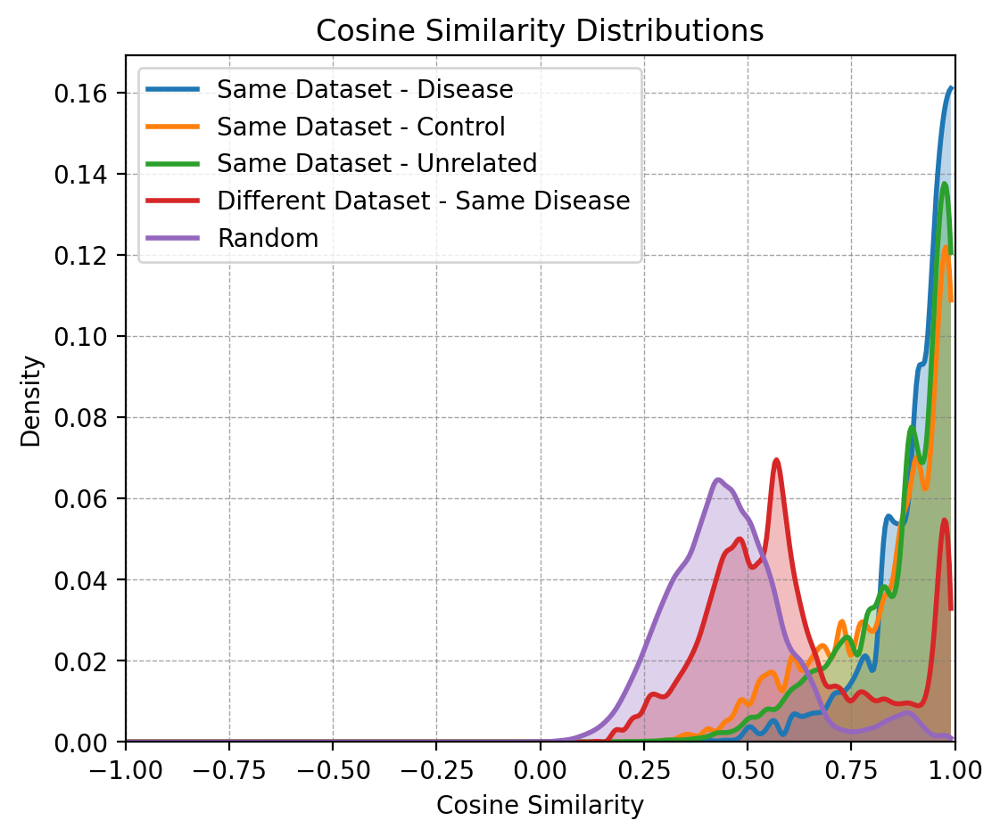

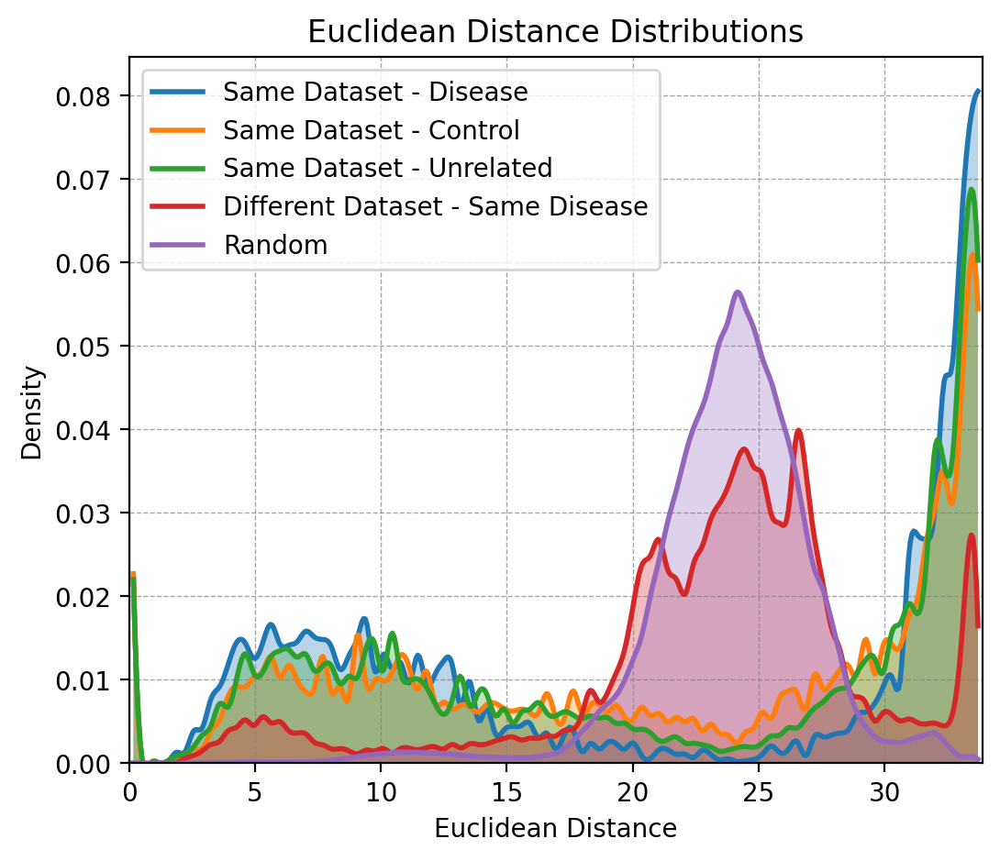

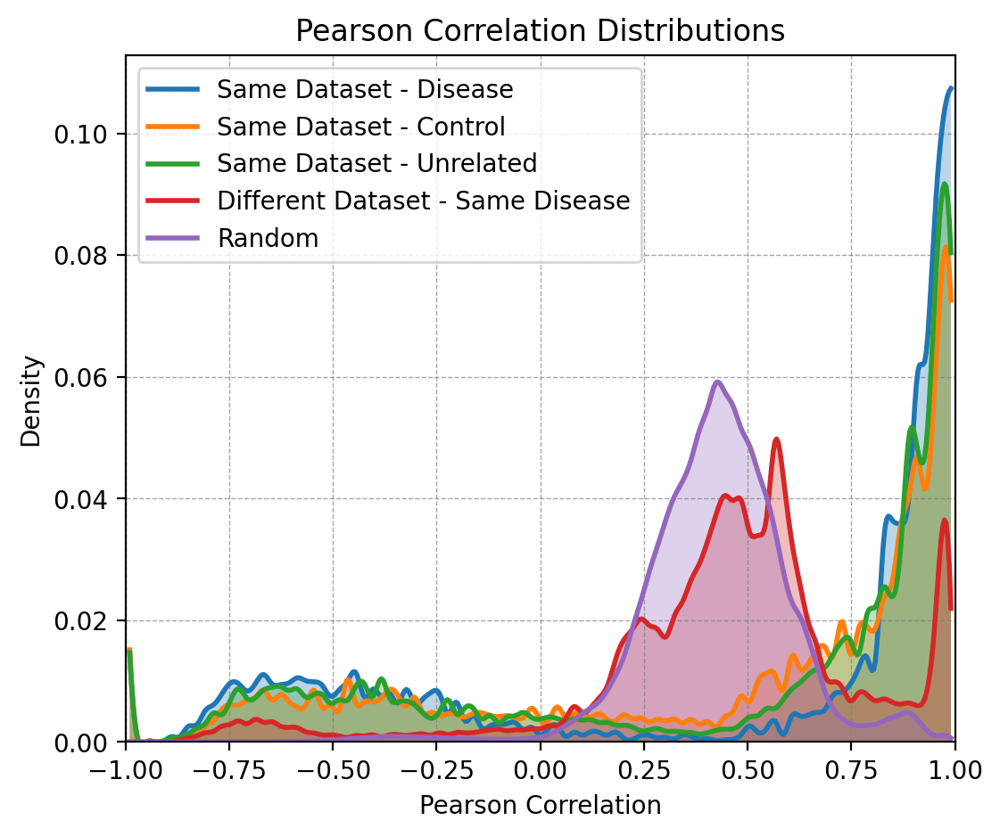

In [32]:
def plot_smoothed_line_through_histogram(all_data, bins, labels):
    """
    Plot smoothed lines for multiple datasets on the same plot.

    Args:
        all_data (list of np.ndarray): List of datasets (counts) to plot.
        bins (np.ndarray): Bin edges for the histogram.
        labels (list of str): Labels for each dataset.
    """
    from scipy.interpolate import make_interp_spline

    # Create the plot
    plt.figure(figsize=(6, 5), dpi=200)

    for data, label in zip(all_data, labels):
        # Compute bin centers
        bin_centers = 0.5 * (bins[:-1] + bins[1:])

        # Spline interpolation for smooth lines
        spline = make_interp_spline(bin_centers, data, k=3)  # Cubic spline
        x_smooth = np.linspace(bin_centers.min(), bin_centers.max(), 500)
        y_smooth = spline(x_smooth)

        # Plot the smoothed line
        plt.plot(x_smooth, y_smooth, label=label, linewidth=2)

        # # Overlay the histogram for context
        # plt.hist(
        #     bin_centers, bins=bins, weights=data, alpha=0.3, label=f"{label} Histogram"
        # )

        # fill_between
        plt.fill_between(x_smooth, y_smooth, alpha=0.3)

    # Add labels and legend
    plt.xlabel(f"{metric_i}")
    plt.ylabel("Density")
    plt.title(f"{metric_i} Distributions")
    plt.legend()
    plt.xlim(np.min(bins), np.max(bins))
    plt.ylim(
        0,
    )
    # show grid
    plt.grid(True, color="gray", linestyle="--", linewidth=0.5, alpha=0.7)

    plt.show()


from scipy.interpolate import make_interp_spline


def normalize_counts_with_bins(
    values_list: List[np.ndarray], fixed_bins: np.ndarray
) -> np.ndarray:
    """Normalize values into a density distribution using histogram bins and spline interpolation.

    Args:
        values_list (List[np.ndarray]): List of value arrays for each category.
        fixed_bins (np.ndarray): Predefined histogram bins for density computation.

    Returns:
        np.ndarray: Smoothed and combined normalized density values.
    """
    normalized_distributions = []
    for values in values_list:
        if len(values) == 0:  # Skip empty arrays
            continue

        # Compute histogram counts and normalize
        counts, _ = np.histogram(values, bins=fixed_bins)
        counts = counts / len(values)  # Normalize counts by the number of values

        normalized_distributions.append(counts)

    # Combine all normalized distributions
    if normalized_distributions:
        combined_normalized = np.sum(normalized_distributions, axis=0)
        combined_normalized = combined_normalized / np.sum(combined_normalized)
    else:
        combined_normalized = np.array([])
    return combined_normalized


# lists to store normalized counts
same_dis_dt_normalized = list()
control_normalized = list()
unrelated_dt_normalized = list()
same_dis_normalized = list()
# related_dis_normalized = list()
# unrelated_normalized = list()
other_normalized = list()


for metric_i in ["Cosine Similarity", "Euclidean Distance", "Pearson Correlation"]:

    # load comparison matrix of all
    matrix = load_comparison_matrix_all(output_dir, metric_i)

    matrix = matrix[mask][:, mask]

    fixed_bins = {
        "Cosine Similarity": np.linspace(-1, 1, 100),
        "Euclidean Distance": np.linspace(0, matrix.max(), 100),
        "Pearson Correlation": np.linspace(-1, 1, 100),
    }
    # loop through dataset
    for i in range(len(same_dis_dt)):

        # values for each dataset iteration i
        same_dis_dt_v_i = list()
        control_v_i = list()
        unrelated_dt_v_i = list()
        same_dis_v_i = list()
        # related_dis_v_i = list()
        # unrelated_v_i = list()
        other_v_i = list()
        # loop through diseases
        for j in range(len(same_dis_dt_i)):
            same_dis_dt_ij = np.array(same_dis_dt[i][j])
            control_ij = np.array(control[i][j])
            unrelated_dt_ij = np.array(unrelated_dt[i][j])
            same_dis_ij = np.array(same_dis[i][j])
            # related_dis_ij = np.array(related_dis[i][j])
            # unrelated_ij = np.array(unrelated[i][j])
            other_ij = np.array(other[i][j])

            if (
                (len(same_dis_dt_ij) == 0)
                or (len(control_ij) == 0)
                or (len(unrelated_dt_ij) == 0)
                or (len(same_dis_ij) == 0)
                or (len(other_ij) == 0)
            ):
                continue

            # get values
            same_dis_dt_v_i.append(matrix[same_dis_dt_ij[:, 0], same_dis_dt_ij[:, 1]])
            control_v_i.append(matrix[control_ij[:, 0], control_ij[:, 1]])
            unrelated_dt_v_i.append(
                matrix[unrelated_dt_ij[:, 0], unrelated_dt_ij[:, 1]]
            )
            same_dis_v_i.append(matrix[same_dis_ij[:, 0], same_dis_ij[:, 1]])
            # related_dis_v_i.append(matrix[related_dis_ij[:, 0], related_dis_ij[:, 1]])
            # unrelated_v_i.append(matrix[unrelated_ij[:, 0], unrelated_ij[:, 1]])
            other_v_i.append(matrix[other_ij[:, 0], other_ij[:, 1]])

            # print("same", np.mean(same_dis_dt_v_i[j]))
            # print("control", np.mean(control_v_i[j]))
            # print("unrelated", np.mean(unrelated_dt_v_i[j]))
            # print("same", np.mean(same_dis_v_i[j]))
            # # print("related", np.mean(related_dis_v_i[j]))
            # # print("unrelated", np.mean(unrelated_v_i[j]))
            # print("other", np.mean(other_v_i[j]))

        # normalize counts for diseases within a dataset
        same_dis_dt_normalized.append(
            normalize_counts_with_bins(same_dis_dt_v_i, fixed_bins.get(metric_i))
        )
        control_normalized.append(
            normalize_counts_with_bins(control_v_i, fixed_bins.get(metric_i))
        )
        unrelated_dt_normalized.append(
            normalize_counts_with_bins(unrelated_dt_v_i, fixed_bins.get(metric_i))
        )

        same_dis_normalized.append(
            normalize_counts_with_bins(same_dis_v_i, fixed_bins.get(metric_i))
        )
        # related_dis_normalized.append(
        #     normalize_counts_with_bins(related_dis_v_i, fixed_bins.get(metric_i))
        # )
        # unrelated_normalized.append(
        #     normalize_counts_with_bins(unrelated_v_i, fixed_bins.get(metric_i))
        # )
        other_normalized.append(
            normalize_counts_with_bins(other_v_i, fixed_bins.get(metric_i))
        )

    same_dis_dt_normalized_all = np.array(same_dis_dt_normalized).sum(axis=0) / len(
        same_dis_dt_normalized
    )
    control_normalized_all = np.array(control_normalized).sum(axis=0) / len(
        control_normalized
    )
    unrelated_dt_normalized_all = np.array(unrelated_dt_normalized).sum(axis=0) / len(
        unrelated_dt_normalized
    )
    same_dis_normalized_all = np.array(same_dis_normalized).sum(axis=0) / len(
        same_dis_normalized
    )
    # related_dis_normalized_all = np.array(related_dis_normalized).sum(axis=0) / len(
    #     related_dis_normalized
    # )
    # unrelated_normalized_all = np.array(unrelated_normalized).sum(axis=0) / len(
    #     unrelated_normalized
    # )
    other_normalized_all = np.array(other_normalized).sum(axis=0) / len(
        other_normalized
    )

    # Example datasets
    all_normalized = [
        same_dis_dt_normalized_all,
        control_normalized_all,
        unrelated_dt_normalized_all,
        same_dis_normalized_all,
        other_normalized_all,
    ]

    labels_plot = [
        "Same Dataset - Disease",
        "Same Dataset - Control",
        "Same Dataset - Unrelated",
        "Different Dataset - Same Disease",
        "Random",
    ]
    plot_smoothed_line_through_histogram(
        all_normalized, fixed_bins.get(metric_i), labels_plot
    )

    # if metric_i == "Euclidean Distance":
    #     break

33.88

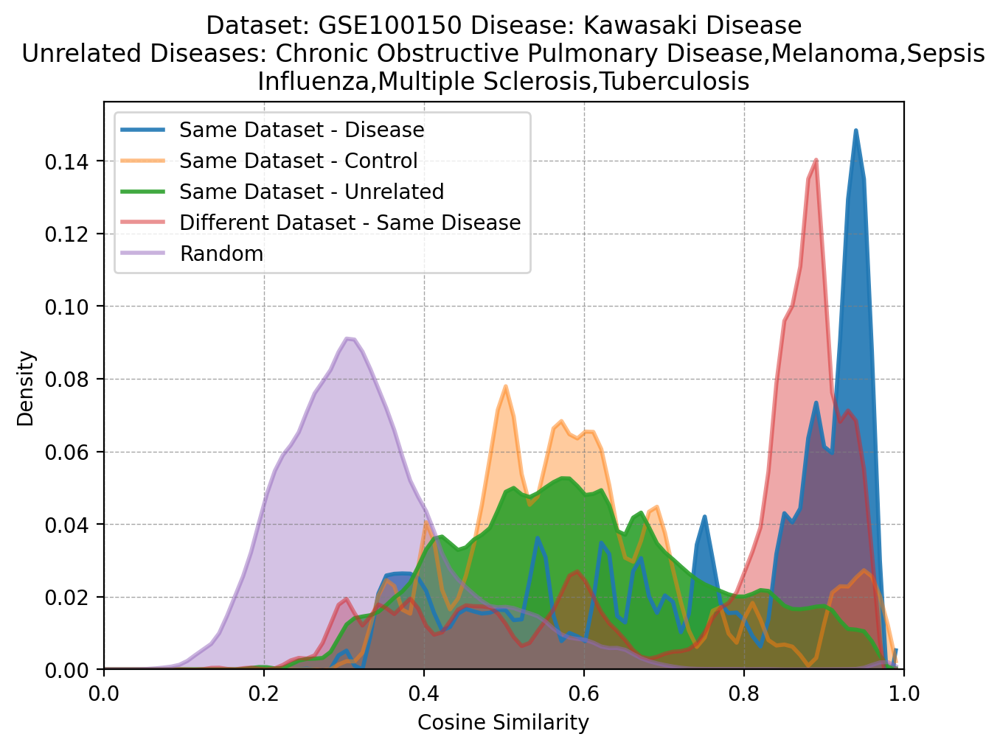

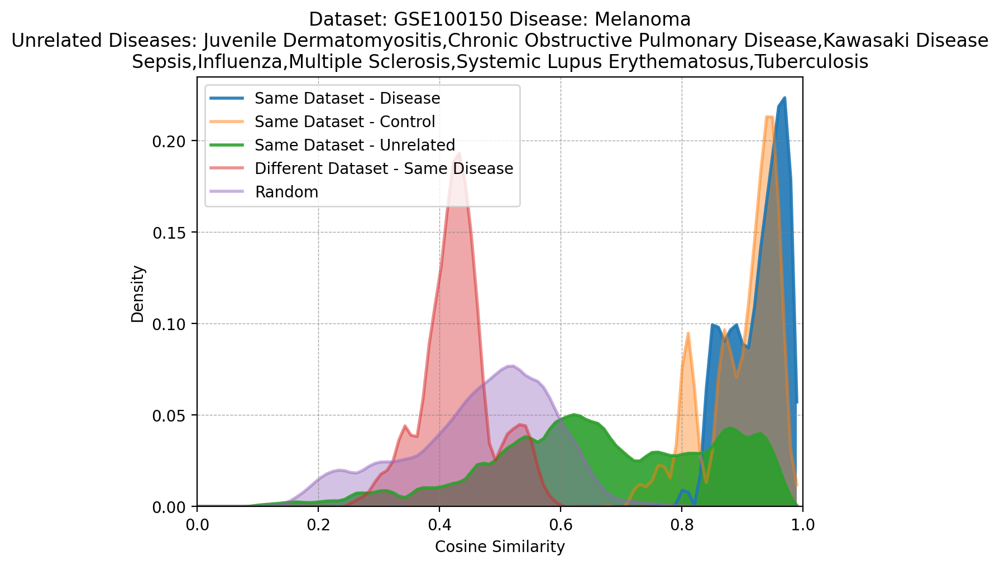

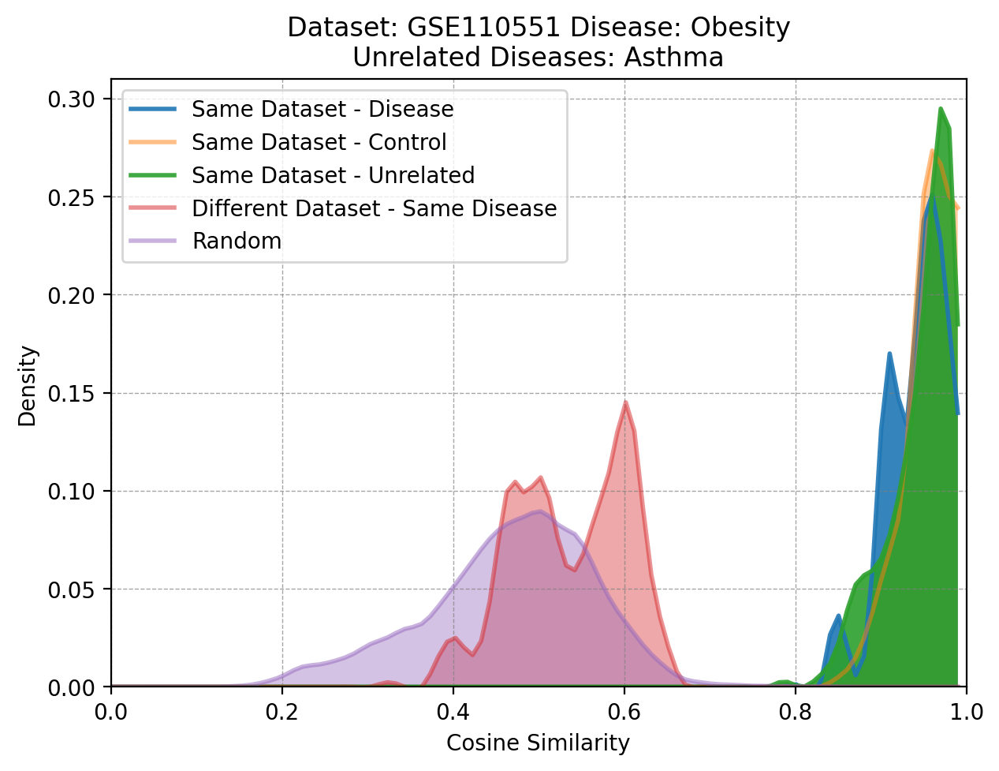

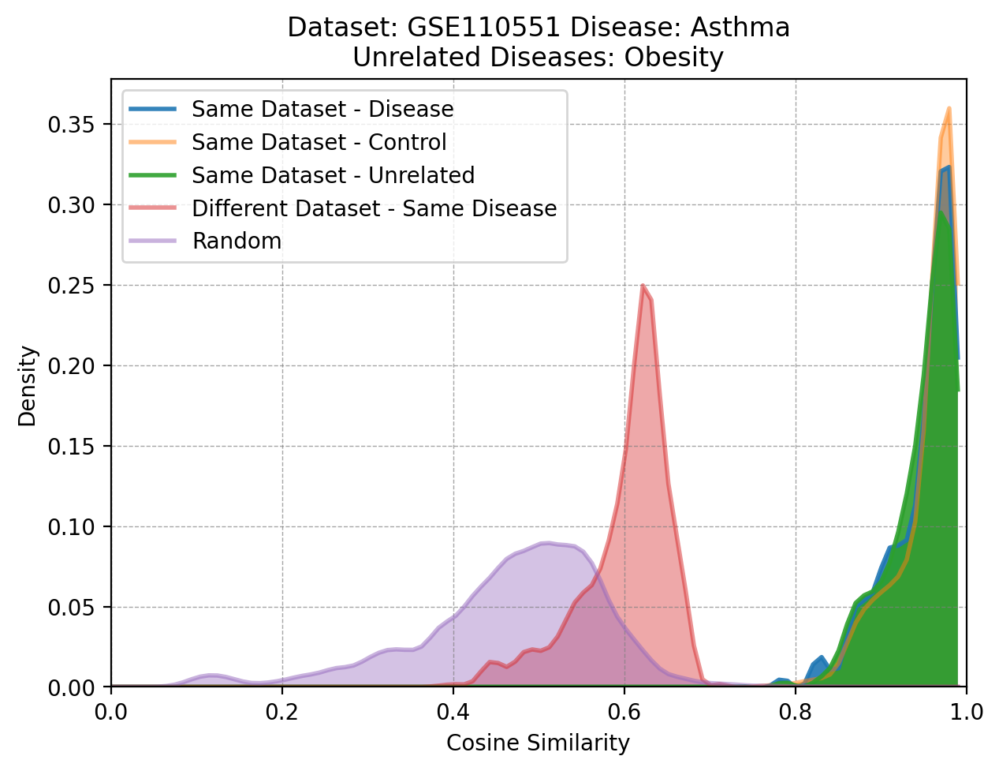

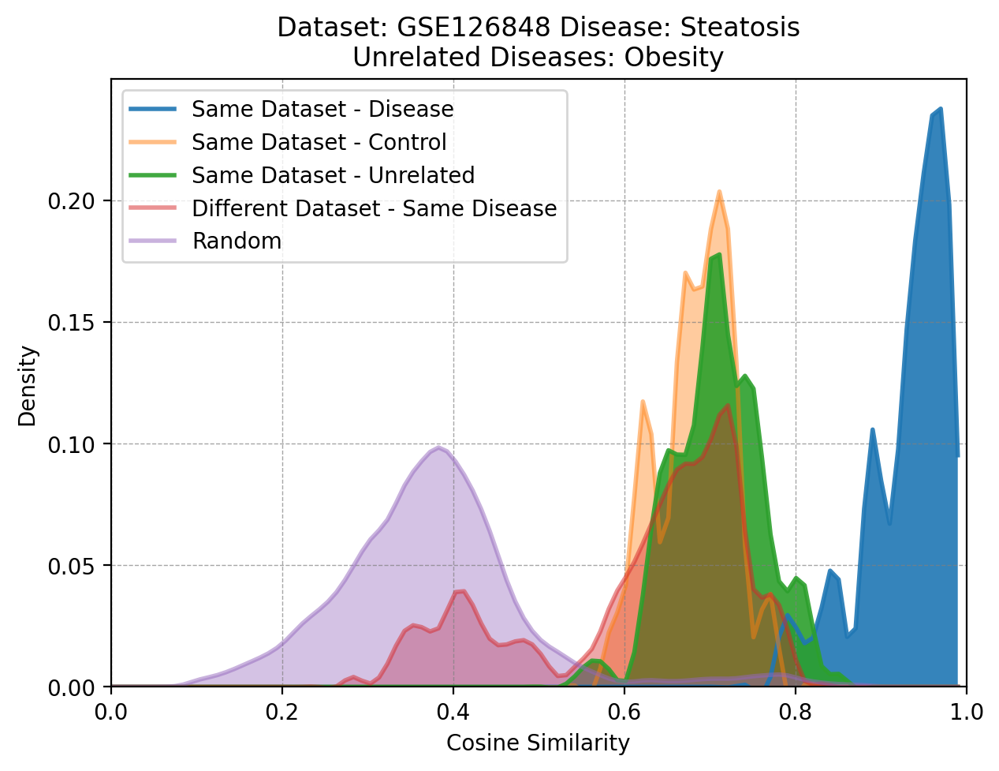

...

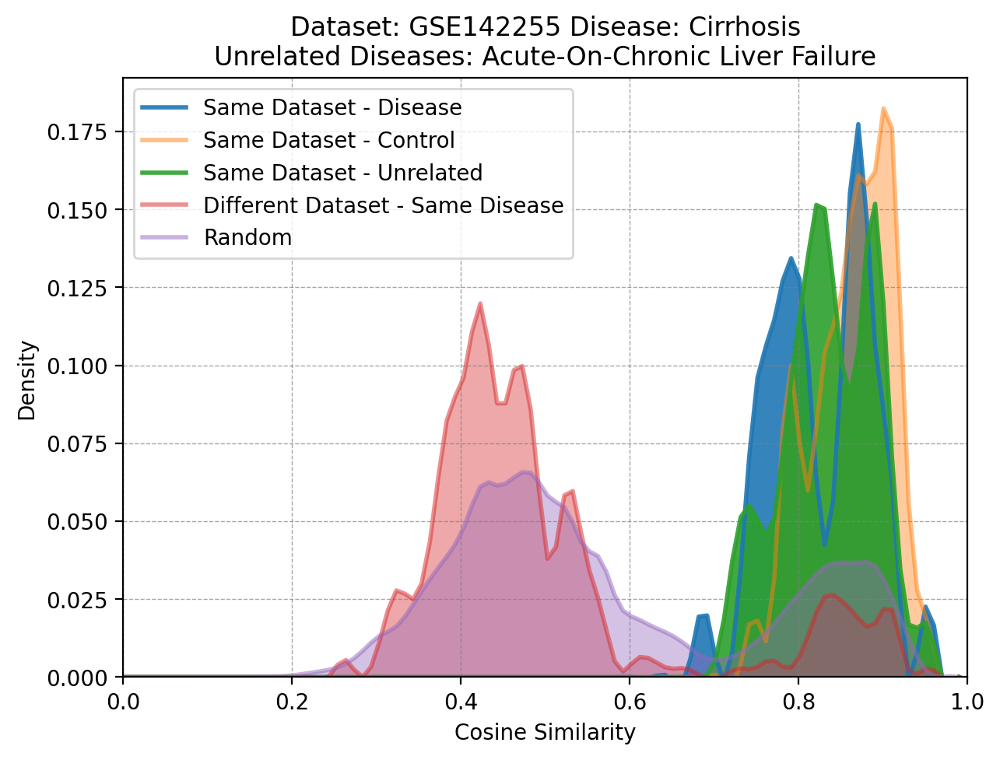

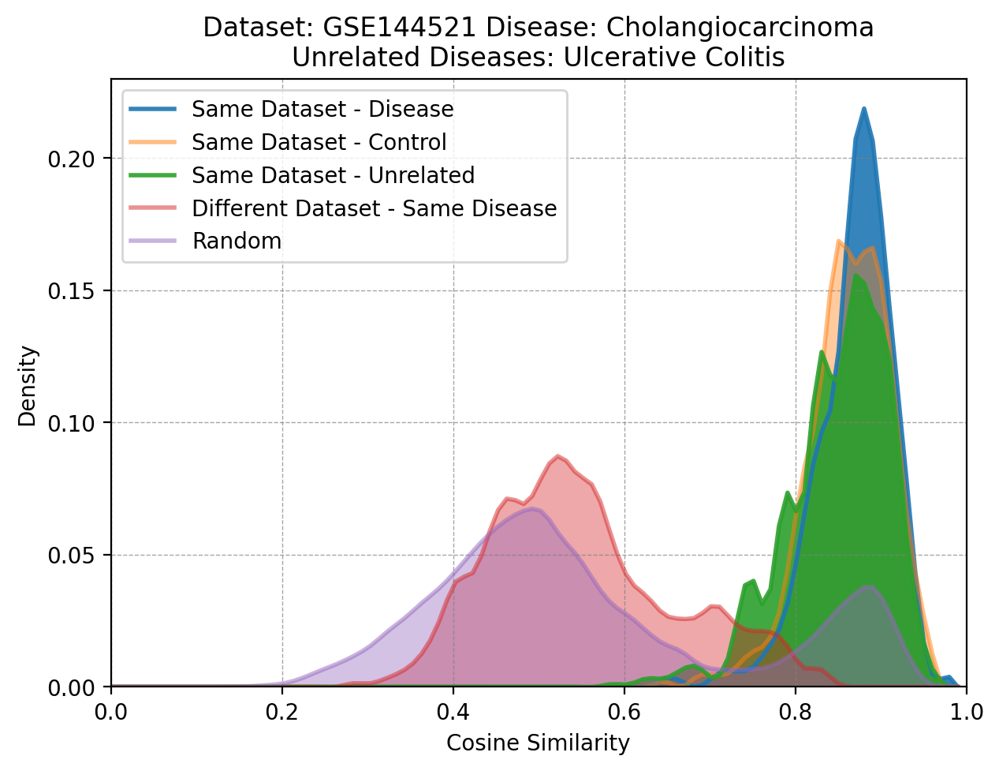

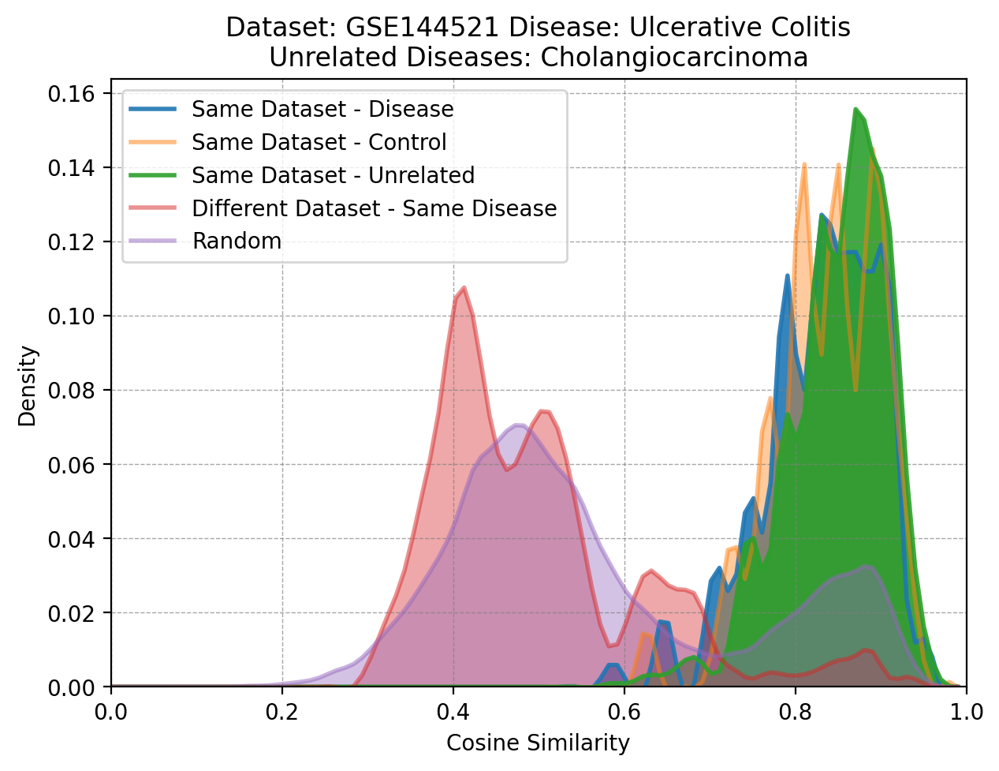

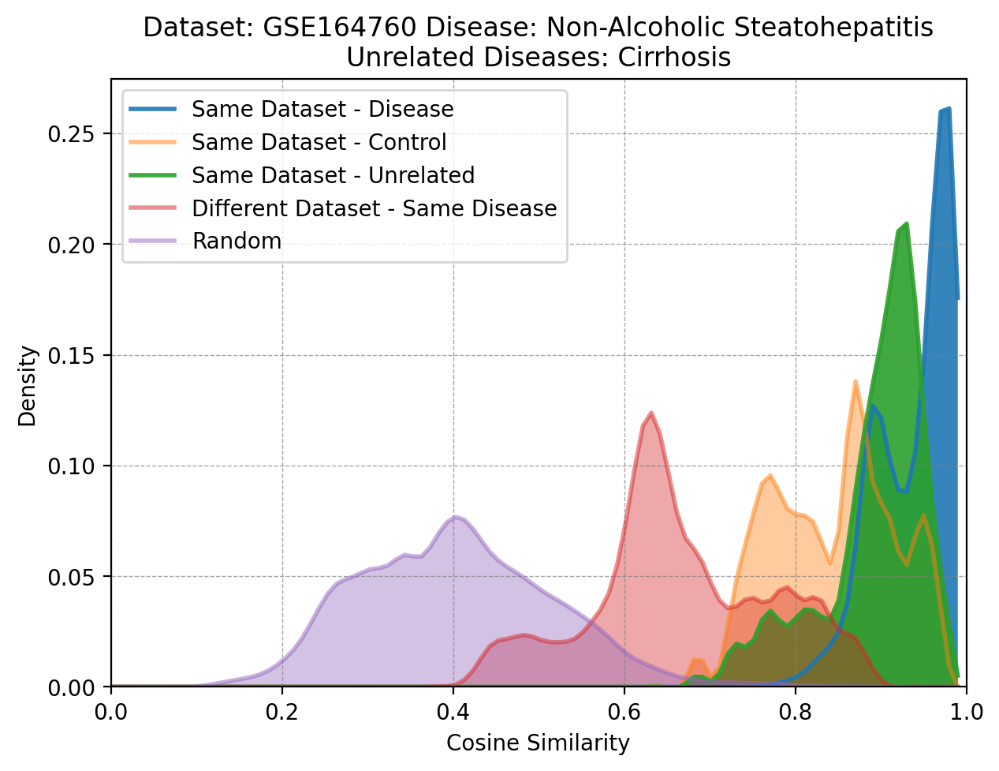

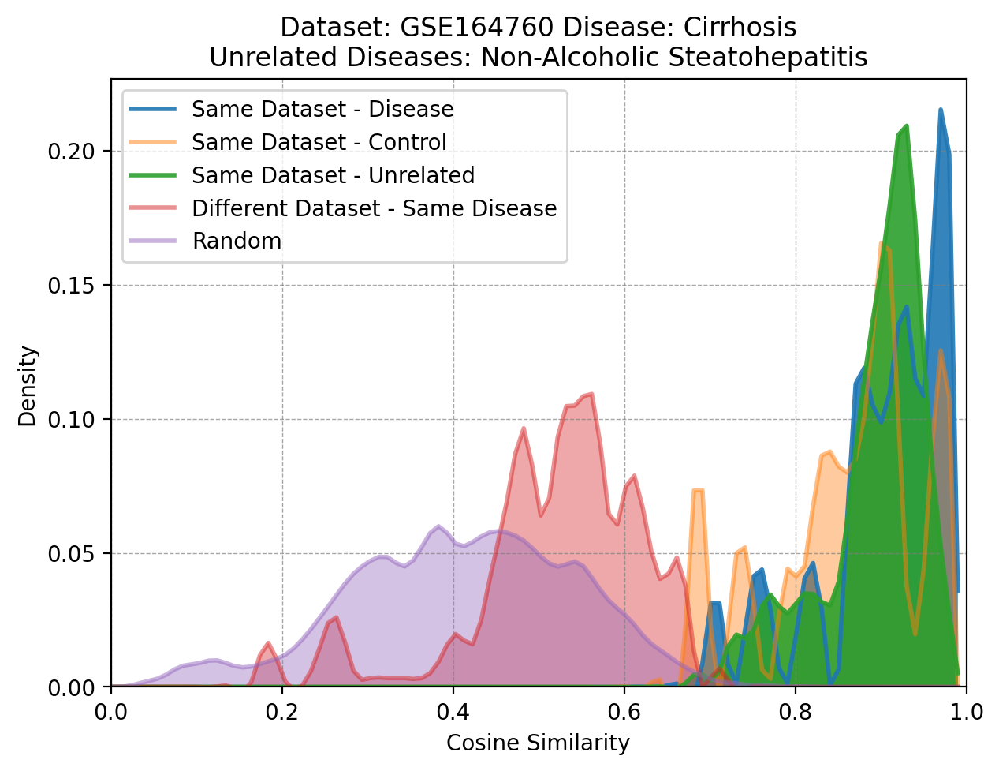

In [69]:
from scipy.interpolate import make_interp_spline


def plot_smoothed_line_through_histogram_single(all_data, bins, labels, title):
    """
    Plot smoothed lines for multiple datasets on the same plot.

    Args:
        all_data (list of np.ndarray): List of datasets (counts) to plot.
        bins (np.ndarray): Bin edges for the histogram.
        labels (list of str): Labels for each dataset.
    """
    plt.figure(figsize=(7, 5), dpi=200)

    for data, label in zip(all_data, labels):
        # Compute histogram counts and normalize
        counts, _ = np.histogram(data, bins=bins)
        counts = counts / counts.sum()  # Normalize counts to density

        # Compute bin centers
        bin_centers = 0.5 * (bins[:-1] + bins[1:])

        # Ensure compatibility between counts and bin_centers
        if len(bin_centers) != len(counts):
            raise ValueError(
                f"Shapes of x (bin_centers={len(bin_centers)}) "
                f"and y (counts={len(counts)}) are incompatible. "
                f"Check the bins and data alignment."
            )

        # Spline interpolation for smooth lines
        spline = make_interp_spline(bin_centers, counts, k=3)  # Cubic spline
        x_smooth = np.linspace(bin_centers.min(), bin_centers.max(), 200)
        y_smooth = spline(x_smooth)

        if label in ["Same Dataset - Disease", "Same Dataset - Unrelated"]:
            # Plot the smoothed line
            plt.plot(x_smooth, y_smooth, label=label, linewidth=2, alpha=0.9)

            # Fill between for visual effect
            plt.fill_between(x_smooth, y_smooth, alpha=0.9)

        else:
            # Plot the smoothed line
            plt.plot(x_smooth, y_smooth, label=label, linewidth=2, alpha=0.5)

            # Fill between for visual effect
            plt.fill_between(x_smooth, y_smooth, alpha=0.4)

    # Add labels and legend
    plt.xlabel(f"{metric_i}")
    plt.ylabel("Density")
    plt.title(title)
    plt.legend()
    plt.grid(True, color="gray", linestyle="--", linewidth=0.5, alpha=0.7)
    plt.xlim(0, 1)
    plt.ylim(0, None)
    plt.show()


# lists to store normalized counts
same_dis_dt_normalized = list()
control_normalized = list()
unrelated_dt_normalized = list()
same_dis_normalized = list()
# related_dis_normalized = list()
# unrelated_normalized = list()
other_normalized = list()


for metric_i in ["Cosine Similarity", "Euclidean Distance", "Pearson Correlation"]:

    # load comparison matrix of all
    matrix = load_comparison_matrix_all(output_dir, metric_i)

    # apply the boolean mask we had
    matrix = matrix[mask][:, mask]

    fixed_bins = {
        "Cosine Similarity": np.linspace(-1, 1, 100),
        "Euclidean Distance": np.linspace(0, matrix.max(), 100),
        "Pearson Correlation": np.linspace(-1, 1, 100),
    }
    # loop through dataset
    for i in range(len(same_dis_dt)):

        # values for each dataset iteration i
        same_dis_dt_v_i = list()
        control_v_i = list()
        unrelated_dt_v_i = list()
        same_dis_v_i = list()
        # related_dis_v_i = list()
        # unrelated_v_i = list()
        other_v_i = list()
        # loop through diseases
        for j in range(len(same_dis_dt_i)):

            same_dis_dt_ij = np.array(same_dis_dt[i][j])
            control_ij = np.array(control[i][j])
            unrelated_dt_ij = np.array(unrelated_dt[i][j])
            same_dis_ij = np.array(same_dis[i][j])
            # related_dis_ij = np.array(related_dis[i][j])
            # unrelated_ij = np.array(unrelated[i][j])
            other_ij = np.array(other[i][j])

            if (
                (len(same_dis_dt_ij) == 0)
                or (len(control_ij) == 0)
                or (len(unrelated_dt_ij) == 0)
                or (len(same_dis_ij) == 0)
                or (len(other_ij) == 0)
            ):
                continue

            # get values
            same_dis_dt_v_i.append(matrix[same_dis_dt_ij[:, 0], same_dis_dt_ij[:, 1]])
            control_v_i.append(matrix[control_ij[:, 0], control_ij[:, 1]])
            unrelated_dt_v_i.append(
                matrix[unrelated_dt_ij[:, 0], unrelated_dt_ij[:, 1]]
            )
            same_dis_v_i.append(matrix[same_dis_ij[:, 0], same_dis_ij[:, 1]])
            # related_dis_v_i.append(matrix[related_dis_ij[:, 0], related_dis_ij[:, 1]])
            # unrelated_v_i.append(matrix[unrelated_ij[:, 0], unrelated_ij[:, 1]])
            other_v_i.append(matrix[other_ij[:, 0], other_ij[:, 1]])

            # Example datasets
            all_normalized = [
                same_dis_dt_v_i[j],
                control_v_i[j],
                unrelated_dt_v_i[j],
                same_dis_v_i[j],
                other_v_i[j],
            ]

            labels_plot = [
                "Same Dataset - Disease",
                "Same Dataset - Control",
                "Same Dataset - Unrelated",
                "Different Dataset - Same Disease",
                "Random",
            ]

            dataset_i = labels_dis[i][j][0]
            disease_i = labels_dis[i][j][1]
            unrelated_i = labels_dis[i][j][2]

            title = f"Dataset: {dataset_i} Disease: {disease_i}\nUnrelated Diseases: { ','.join(unrelated_i)}"
            if len(unrelated_i) > 3:
                title = f"Dataset: {dataset_i} Disease: {disease_i}\nUnrelated Diseases: { ','.join(unrelated_i[:3])}\n{','.join(unrelated_i[3:])}"

            plot_smoothed_line_through_histogram_single(
                all_normalized, fixed_bins.get(metric_i), labels_plot, title
            )

    break

In [63]:
df_obs[df_obs["dataset"] == "GSE164760"]

,ids,dataset,dataset_id,batch,batch_id,dsaid,tissue,n_genes,disease,celltype,...,library,mesh_id_study,mesh_id,mesh_disease,celltype_id,test_split_1,test_split_2,test_split_3,gsm,relationship
763,DSA10169;GSM5018269;Control,GSE164760,GSE164760,99,99,DSA10169,Liver,16118,Control,Control,...,Microarray,D005355,Control,Control,7,True,False,False,GSM5018269,control
764,DSA10169;GSM5018273;Control,GSE164760,GSE164760,99,99,DSA10169,Liver,16118,Control,Control,...,Microarray,D005355,Control,Control,7,True,False,False,GSM5018273,control
765,DSA10169;GSM5018278;Case,GSE164760,GSE164760,99,99,DSA10169,Liver,16118,Cirrhosis,Fibrosis,...,Microarray,D005355,D005355,Fibrosis,16,True,False,False,GSM5018278,same disease
766,DSA10169;GSM5018281;Case,GSE164760,GSE164760,99,99,DSA10169,Liver,16118,Cirrhosis,Fibrosis,...,Microarray,D005355,D005355,Fibrosis,16,True,False,False,GSM5018281,same disease
767,DSA10170;GSM5018268;Control,GSE164760,GSE164760,99,99,DSA10170,Liver,16118,Control,Control,...,Microarray,D065626,Control,Control,7,True,False,False,GSM5018268,other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5926,DSA10170;GSM5018327;Case,GSE164760,GSE164760,99,99,DSA10170,Liver,16118,Non-Alcoholic Steatohepatitis,Non-alcoholic Fatty Liver Disease,...,Microarray,D065626,D065626,Non-alcoholic Fatty Liver Disease,28,False,False,True,GSM5018327,unrelated disease
5957,DSA10170;GSM5018319;Case,GSE164760,GSE164760,99,99,DSA10170,Liver,16118,Non-Alcoholic Steatohepatitis,Non-alcoholic Fatty Liver Disease,...,Microarray,D065626,D065626,Non-alcoholic Fatty Liver Disease,28,False,True,False,GSM5018319,unrelated disease
6127,DSA10170;GSM5018305;Case,GSE164760,GSE164760,99,99,DSA10170,Liver,16118,Non-Alcoholic Steatohepatitis,Non-alcoholic Fatty Liver Disease,...,Microarray,D065626,D065626,Non-alcoholic Fatty Liver Disease,28,False,True,False,GSM5018305,unrelated disease
6147,DSA10170;GSM5018355;Case,GSE164760,GSE164760,99,99,DSA10170,Liver,16118,Non-Alcoholic Steatohepatitis,Non-alcoholic Fatty Liver Disease,...,Microarray,D065626,D065626,Non-alcoholic Fatty Liver Disease,28,False,True,False,GSM5018355,unrelated disease


In [67]:
mesh_id_2_tree_terms["D005355"]

['C23.550.355']

In [48]:
unrelated_i

array(['Non-Alcoholic Steatohepatitis'], dtype=object)

In [21]:
labels

NameError: name 'labels' is not defined

In [353]:
.shape

(6165, 6165)

In [379]:
df_obs[df_obs["gsm"] == "GSE141804"]

,ids,dataset,dataset_id,batch,batch_id,dsaid,tissue,n_genes,disease,celltype,...,library,mesh_id_study,mesh_id,mesh_disease,celltype_id,test_split_1,test_split_2,test_split_3,gsm,relationship


In [13]:
df_obs[df_obs["dataset"] == "GSE141804"]["gsm"].value_counts()

gsm
GSM4213577    1
GSM4213540    1
GSM4213541    1
GSM4213556    1
GSM4213578    1
GSM4213551    1
GSM4213553    1
GSM4213564    1
GSM4213573    1
GSM4213558    1
GSM4213554    1
GSM4213583    1
GSM4213579    1
GSM4213569    1
GSM4213532    1
GSM4213568    1
GSM4213537    1
GSM4213533    1
GSM4213566    1
GSM4213545    1
GSM4213552    1
GSM4213567    1
GSM4213550    1
GSM4213563    1
GSM4213562    1
GSM4213535    1
GSM4213580    1
GSM4213534    1
GSM4213536    1
GSM4213538    1
GSM4213539    1
GSM4213542    1
GSM4213543    1
GSM4213544    1
GSM4213565    1
GSM4213570    1
GSM4213571    1
GSM4213572    1
GSM4213581    1
GSM4213555    1
GSM4213557    1
GSM4213559    1
GSM4213561    1
GSM4213582    1
GSM4213560    1
GSM4213531    1
Name: count, dtype: int64

(array([5.599e+03, 3.690e+02, 9.500e+01, 6.000e+01, 4.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 3.800e+01]),
 array([ 1. ,  1.9,  2.8,  3.7,  4.6,  5.5,  6.4,  7.3,  8.2,  9.1, 10. ]),
 <BarContainer object of 10 artists>)

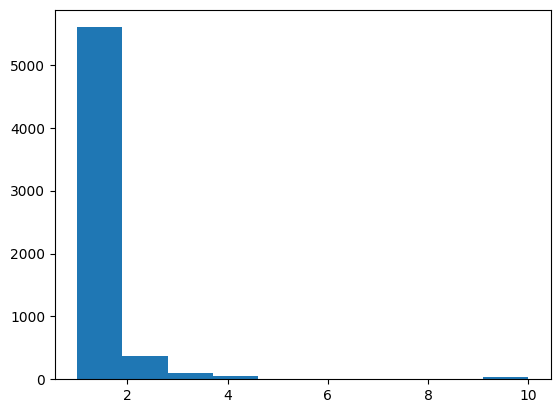

In [337]:
plt.hist(Counter([x.split(";")[1] for x in df_obs["ids"]]).values())

In [ ]:
adata_orig

(array([1.10412e+05, 7.54100e+03, 9.49000e+02, 0.00000e+00, 2.26000e+02,
        2.70000e+01, 0.00000e+00, 8.00000e+00, 7.00000e+00, 1.00000e+00]),
 array([1. , 1.7, 2.4, 3.1, 3.8, 4.5, 5.2, 5.9, 6.6, 7.3, 8. ]),
 <BarContainer object of 10 artists>)

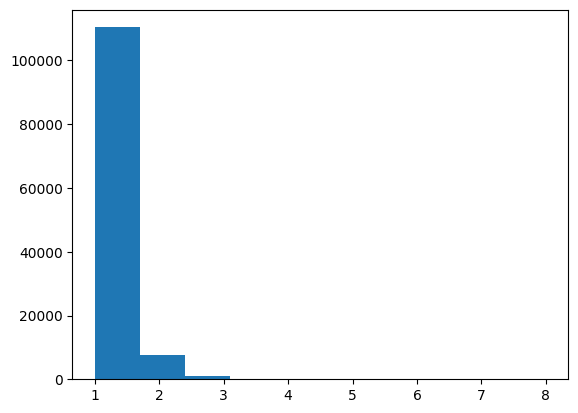

In [333]:
from collections import Counter

plt.hist(Counter(all_gsms).values())

In [292]:
unrelated_diseases

[('GSE100150',
  'Kawasaki Disease',
  array(['Chronic Obstructive Pulmonary Disease', 'Melanoma', 'Sepsis',
         'Influenza', 'Multiple Sclerosis', 'Tuberculosis'], dtype=object)),
 ('GSE100150',
  'Melanoma',
  array(['Juvenile Dermatomyositis',
         'Chronic Obstructive Pulmonary Disease', 'Kawasaki Disease',
         'Sepsis', 'Influenza', 'Multiple Sclerosis',
         'Systemic Lupus Erythematosus', 'Tuberculosis'], dtype=object)),
 ('GSE100150',
  'Influenza',
  array(['Juvenile Dermatomyositis', 'Kawasaki Disease', 'Melanoma',
         'Multiple Sclerosis', 'Systemic Lupus Erythematosus'], dtype=object)),
 ('GSE100150',
  'Chronic Obstructive Pulmonary Disease',
  array(['Juvenile Dermatomyositis', 'Kawasaki Disease', 'Melanoma',
         'Multiple Sclerosis', 'Systemic Lupus Erythematosus',
         'Tuberculosis'], dtype=object)),
 ('GSE100150',
  'Sepsis',
  array(['Juvenile Dermatomyositis', 'Kawasaki Disease', 'Melanoma',
         'Multiple Sclerosis', 'Systemic Lu